# Bakery Sales

## Introdução

Um dos passos mais cruciais para melhorar o desempenho de um negócio é identificar oportunidades e avaliar a performance de vendas, de forma a estabelecer uma estratégia eficaz. Isto pode ser alcançado através da análise de dados de vendas. A análise detalhada destes dados permite compreender padrões de consumo, prever tendências e tomar decisões informadas que podem impulsionar o crescimento e a rentabilidade do negócio.

## Contexto do Dataset
O dataset pertence a uma padaria francesa e fornece os detalhes das transações diárias dos clientes entre 01/01/2021 e 30/09/2022.

## Objetivo
Esta análise tem como objetivo compreender melhor o desempenho do negócio, rastreando os dados históricos de vendas para obter insights valiosos.


#### Importar Bibliotecas

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

#### Carregar o ficheiro .csv

In [8]:
df = pd.read_csv('Bakery sales.csv', encoding='Mac_Roman',  index_col=0)

In [9]:
df

,date,time,ticket_number,article,Quantity,unit_price
0,1/2/21,8:38,150040,BAGUETTE,1,"0,90 €"
1,1/2/21,8:38,150040,PAIN AU CHOCOLAT,3,"1,20 €"
4,1/2/21,9:14,150041,PAIN AU CHOCOLAT,2,"1,20 €"
5,1/2/21,9:14,150041,PAIN,1,"1,15 €"
8,1/2/21,9:25,150042,TRADITIONAL BAGUETTE,5,"1,20 €"
...,...,...,...,...,...,...
511387,9/30/22,18:52,288911,COUPE,1,"0,15 €"
511388,9/30/22,18:52,288911,BOULE 200G,1,"1,20 €"
511389,9/30/22,18:52,288911,COUPE,2,"0,15 €"
511392,9/30/22,18:55,288912,TRADITIONAL BAGUETTE,1,"1,30 €"


#### Retirar o símbolo na coluna unit_price

In [11]:
df['unit_price'] = df['unit_price'].str.replace(' €','').str.replace(',','.')

In [12]:
df

,date,time,ticket_number,article,Quantity,unit_price
0,1/2/21,8:38,150040,BAGUETTE,1,0.90
1,1/2/21,8:38,150040,PAIN AU CHOCOLAT,3,1.20
4,1/2/21,9:14,150041,PAIN AU CHOCOLAT,2,1.20
5,1/2/21,9:14,150041,PAIN,1,1.15
8,1/2/21,9:25,150042,TRADITIONAL BAGUETTE,5,1.20
...,...,...,...,...,...,...
511387,9/30/22,18:52,288911,COUPE,1,0.15
511388,9/30/22,18:52,288911,BOULE 200G,1,1.20
511389,9/30/22,18:52,288911,COUPE,2,0.15
511392,9/30/22,18:55,288912,TRADITIONAL BAGUETTE,1,1.30


#### Alterar o tipo de dados da coluna unit_price

In [15]:
df['unit_price'] = df['unit_price'].astype(float)

#### Criar uma nova coluna com o preço total

In [17]:
df['total_price'] = df['Quantity'] * df['unit_price']

In [18]:
df

,date,time,ticket_number,article,Quantity,unit_price,total_price
0,1/2/21,8:38,150040,BAGUETTE,1,0.90,0.90
1,1/2/21,8:38,150040,PAIN AU CHOCOLAT,3,1.20,3.60
4,1/2/21,9:14,150041,PAIN AU CHOCOLAT,2,1.20,2.40
5,1/2/21,9:14,150041,PAIN,1,1.15,1.15
8,1/2/21,9:25,150042,TRADITIONAL BAGUETTE,5,1.20,6.00
...,...,...,...,...,...,...,...
511387,9/30/22,18:52,288911,COUPE,1,0.15,0.15
511388,9/30/22,18:52,288911,BOULE 200G,1,1.20,1.20
511389,9/30/22,18:52,288911,COUPE,2,0.15,0.30
511392,9/30/22,18:55,288912,TRADITIONAL BAGUETTE,1,1.30,1.30


### Criaram-se colunas adicionais como, month, day, hour e year para análises temporais.

#### E alterámos o tipo de dados

In [21]:
df["datetime"] = df["date"] + " " + df["time"]
df["datetime"]

0           1/2/21 8:38
1           1/2/21 8:38
4           1/2/21 9:14
5           1/2/21 9:14
8           1/2/21 9:25
              ...      
511387    9/30/22 18:52
511388    9/30/22 18:52
511389    9/30/22 18:52
511392    9/30/22 18:55
511395    9/30/22 18:56
Name: datetime, Length: 234005, dtype: object

In [22]:
df["datetime"] = pd.to_datetime(df["datetime"], format="%m/%d/%y %H:%M")
df['date'] = pd.to_datetime(df['date'], format='%m/%d/%y')

In [23]:
# Obter nomes do mês e do dia da semana, respetivamente
df["month"] = df["date"].dt.month_name()
df["day"] = df["date"].dt.day_name()
df["hour"] = df["datetime"].dt.hour
df['year'] = df['date'].dt.year
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 234005 entries, 0 to 511395
Data columns (total 12 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   date           234005 non-null  datetime64[ns]
 1   time           234005 non-null  object        
 2   ticket_number  234005 non-null  int64         
 3   article        234005 non-null  object        
 4   Quantity       234005 non-null  int64         
 5   unit_price     234005 non-null  float64       
 6   total_price    234005 non-null  float64       
 7   datetime       234005 non-null  datetime64[ns]
 8   month          234005 non-null  object        
 9   day            234005 non-null  object        
 10  hour           234005 non-null  int32         
 11  year           234005 non-null  int32         
dtypes: datetime64[ns](2), float64(2), int32(2), int64(2), object(4)
memory usage: 21.4+ MB


In [24]:
# Create function from hour to day time
def day_time (hour):
    if hour < 12:
        return 'Manhã'
    elif hour < 17:
        return 'Tarde'
    else:
        return 'Noite'
    
# Apply function to the new column    
df['periodo_do_dia'] = df.hour.apply(day_time)
df.head(10)

,date,time,ticket_number,article,Quantity,unit_price,total_price,datetime,month,day,hour,year,periodo_do_dia
0,2021-01-02,8:38,150040,BAGUETTE,1,0.90,0.90,2021-01-02 08:38:00,January,Saturday,8,2021,Manhã
1,2021-01-02,8:38,150040,PAIN AU CHOCOLAT,3,1.20,3.60,2021-01-02 08:38:00,January,Saturday,8,2021,Manhã
4,2021-01-02,9:14,150041,PAIN AU CHOCOLAT,2,1.20,2.40,2021-01-02 09:14:00,January,Saturday,9,2021,Manhã
5,2021-01-02,9:14,150041,PAIN,1,1.15,1.15,2021-01-02 09:14:00,January,Saturday,9,2021,Manhã
8,2021-01-02,9:25,150042,TRADITIONAL BAGUETTE,5,1.20,6.00,2021-01-02 09:25:00,January,Saturday,9,2021,Manhã
11,2021-01-02,9:25,150043,BAGUETTE,2,0.90,1.80,2021-01-02 09:25:00,January,Saturday,9,2021,Manhã
12,2021-01-02,9:25,150043,CROISSANT,3,1.10,3.30,2021-01-02 09:25:00,January,Saturday,9,2021,Manhã
15,2021-01-02,9:27,150044,BANETTE,1,1.05,1.05,2021-01-02 09:27:00,January,Saturday,9,2021,Manhã
18,2021-01-02,9:32,150045,TRADITIONAL BAGUETTE,3,1.20,3.60,2021-01-02 09:32:00,January,Saturday,9,2021,Manhã
19,2021-01-02,9:32,150045,CROISSANT,6,1.10,6.60,2021-01-02 09:32:00,January,Saturday,9,2021,Manhã


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 234005 entries, 0 to 511395
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   date            234005 non-null  datetime64[ns]
 1   time            234005 non-null  object        
 2   ticket_number   234005 non-null  int64         
 3   article         234005 non-null  object        
 4   Quantity        234005 non-null  int64         
 5   unit_price      234005 non-null  float64       
 6   total_price     234005 non-null  float64       
 7   datetime        234005 non-null  datetime64[ns]
 8   month           234005 non-null  object        
 9   day             234005 non-null  object        
 10  hour            234005 non-null  int32         
 11  year            234005 non-null  int32         
 12  periodo_do_dia  234005 non-null  object        
dtypes: datetime64[ns](2), float64(2), int32(2), int64(2), object(5)
memory usage: 23.2+ MB


#### Agrupar por ticket_number

In [27]:
somas_por_ticket = df.groupby('ticket_number')['total_price'].sum()

In [28]:
somas_por_ticket

ticket_number
150040     4.50
150041     3.55
150042     6.00
150043     5.10
150044     1.05
          ...  
288908     2.70
288910     1.30
288911    12.15
288912     1.30
288913     1.30
Name: total_price, Length: 136451, dtype: float64

#### Dados estatísticos acerca do total_price agrupado por ticket_number

In [30]:
somas_por_ticket.describe()

count    136451.000000
mean          4.094077
std           4.536965
min        -200.000000
25%           1.300000
50%           2.500000
75%           5.100000
max         200.000000
Name: total_price, dtype: float64

In [31]:
somas_por_ticket = df.groupby('ticket_number')['total_price'].mean()
somas_por_ticket

ticket_number
150040    2.250
150041    1.775
150042    6.000
150043    2.550
150044    1.050
          ...  
288908    2.700
288910    1.300
288911    2.430
288912    1.300
288913    1.300
Name: total_price, Length: 136451, dtype: float64

#### Como existem valores negativos na quantidade, para chegar a uma média mais fidedigna, usei este raciocínio.

In [33]:
negativos = df[df['Quantity'] < 0]

In [34]:
negativos.count()

date              1295
time              1295
ticket_number     1295
article           1295
Quantity          1295
unit_price        1295
total_price       1295
datetime          1295
month             1295
day               1295
hour              1295
year              1295
periodo_do_dia    1295
dtype: int64

In [35]:
simetricos = negativos.count() * 2

In [36]:
simetricos['total_price']

2590

In [37]:
df['total_price'].count()

234005

In [38]:
somas_por_ticket.count() # com os ticket_number agrupados

136451

In [39]:
df['total_price'].sum()

558640.8500000001

In [40]:
df_sem_negativos = df['total_price'].sum() / (somas_por_ticket.count() - simetricos['total_price'])

In [41]:
print(f'Média: {df_sem_negativos:.2f}')

Média: 4.17


### Análise

In [43]:
df

,date,time,ticket_number,article,Quantity,unit_price,total_price,datetime,month,day,hour,year,periodo_do_dia
0,2021-01-02,8:38,150040,BAGUETTE,1,0.90,0.90,2021-01-02 08:38:00,January,Saturday,8,2021,Manhã
1,2021-01-02,8:38,150040,PAIN AU CHOCOLAT,3,1.20,3.60,2021-01-02 08:38:00,January,Saturday,8,2021,Manhã
4,2021-01-02,9:14,150041,PAIN AU CHOCOLAT,2,1.20,2.40,2021-01-02 09:14:00,January,Saturday,9,2021,Manhã
5,2021-01-02,9:14,150041,PAIN,1,1.15,1.15,2021-01-02 09:14:00,January,Saturday,9,2021,Manhã
8,2021-01-02,9:25,150042,TRADITIONAL BAGUETTE,5,1.20,6.00,2021-01-02 09:25:00,January,Saturday,9,2021,Manhã
...,...,...,...,...,...,...,...,...,...,...,...,...,...
511387,2022-09-30,18:52,288911,COUPE,1,0.15,0.15,2022-09-30 18:52:00,September,Friday,18,2022,Noite
511388,2022-09-30,18:52,288911,BOULE 200G,1,1.20,1.20,2022-09-30 18:52:00,September,Friday,18,2022,Noite
511389,2022-09-30,18:52,288911,COUPE,2,0.15,0.30,2022-09-30 18:52:00,September,Friday,18,2022,Noite
511392,2022-09-30,18:55,288912,TRADITIONAL BAGUETTE,1,1.30,1.30,2022-09-30 18:55:00,September,Friday,18,2022,Noite


## Por ano

In [45]:
df_2021 = df[df['year'] == 2021]
df_2021

,date,time,ticket_number,article,Quantity,unit_price,total_price,datetime,month,day,hour,year,periodo_do_dia
0,2021-01-02,8:38,150040,BAGUETTE,1,0.90,0.90,2021-01-02 08:38:00,January,Saturday,8,2021,Manhã
1,2021-01-02,8:38,150040,PAIN AU CHOCOLAT,3,1.20,3.60,2021-01-02 08:38:00,January,Saturday,8,2021,Manhã
4,2021-01-02,9:14,150041,PAIN AU CHOCOLAT,2,1.20,2.40,2021-01-02 09:14:00,January,Saturday,9,2021,Manhã
5,2021-01-02,9:14,150041,PAIN,1,1.15,1.15,2021-01-02 09:14:00,January,Saturday,9,2021,Manhã
8,2021-01-02,9:25,150042,TRADITIONAL BAGUETTE,5,1.20,6.00,2021-01-02 09:25:00,January,Saturday,9,2021,Manhã
...,...,...,...,...,...,...,...,...,...,...,...,...,...
285811,2021-12-31,17:56,227277,BAGUETTE,1,0.90,0.90,2021-12-31 17:56:00,December,Friday,17,2021,Noite
285812,2021-12-31,17:56,227277,FICELLE,1,0.60,0.60,2021-12-31 17:56:00,December,Friday,17,2021,Noite
285815,2021-12-31,17:59,227278,BAGUETTE,1,0.90,0.90,2021-12-31 17:59:00,December,Friday,17,2021,Noite
285816,2021-12-31,17:59,227278,PAIN,1,1.15,1.15,2021-12-31 17:59:00,December,Friday,17,2021,Noite


In [46]:
df_2022 = df[df['year'] == 2022]
df_2022

,date,time,ticket_number,article,Quantity,unit_price,total_price,datetime,month,day,hour,year,periodo_do_dia
285824,2022-01-02,7:39,227281,BANETTE,5,1.05,5.25,2022-01-02 07:39:00,January,Sunday,7,2022,Manhã
285825,2022-01-02,7:39,227281,CEREAL BAGUETTE,3,1.25,3.75,2022-01-02 07:39:00,January,Sunday,7,2022,Manhã
285828,2022-01-02,7:44,227282,BANETTE,1,1.05,1.05,2022-01-02 07:44:00,January,Sunday,7,2022,Manhã
285829,2022-01-02,7:44,227282,PAIN AU CHOCOLAT,2,1.20,2.40,2022-01-02 07:44:00,January,Sunday,7,2022,Manhã
285832,2022-01-02,7:45,227283,BAGUETTE,1,0.90,0.90,2022-01-02 07:45:00,January,Sunday,7,2022,Manhã
...,...,...,...,...,...,...,...,...,...,...,...,...,...
511387,2022-09-30,18:52,288911,COUPE,1,0.15,0.15,2022-09-30 18:52:00,September,Friday,18,2022,Noite
511388,2022-09-30,18:52,288911,BOULE 200G,1,1.20,1.20,2022-09-30 18:52:00,September,Friday,18,2022,Noite
511389,2022-09-30,18:52,288911,COUPE,2,0.15,0.30,2022-09-30 18:52:00,September,Friday,18,2022,Noite
511392,2022-09-30,18:55,288912,TRADITIONAL BAGUETTE,1,1.30,1.30,2022-09-30 18:55:00,September,Friday,18,2022,Noite


#### Produtos mais vendidos

In [48]:
# Agrupar por 'article' e somar as quantidades
produtos_mais_vendidos = df.groupby('article')['Quantity'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
produtos_mais_vendidos = produtos_mais_vendidos.sort_values(ascending=False)

# Mostrar os top 10 produtos mais vendidos
print(produtos_mais_vendidos.head(10))

article
TRADITIONAL BAGUETTE    117463
CROISSANT                29654
PAIN AU CHOCOLAT         25236
COUPE                    23505
BANETTE                  22732
BAGUETTE                 22053
CEREAL BAGUETTE           7427
SPECIAL BREAD             5456
FORMULE SANDWICH          5181
TARTELETTE                5020
Name: Quantity, dtype: int64


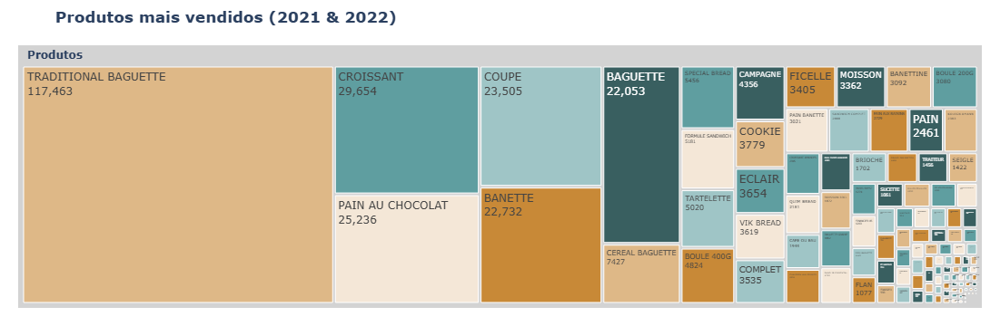

In [197]:
fig = px.treemap(data_frame=df, 
                path=[px.Constant('<b> Produtos'), 
                      'article'], 
                title = '<b> Produtos mais vendidos (2021 & 2022)',
                values= 'Quantity')

fig.data[0].textinfo = 'label+text+value'

fig.update_traces(root_color='lightgrey')
 
fig.update_layout(treemapcolorway = ['burlywood', 'cadetblue'], 
                  margin = dict(t=50, l=20, r=20, b=20))

fig.layout.hovermode = False
fig.show()

**O que mostra:**
 - Um gráfico de hierarquia que destaca os produtos mais vendidos em 2021 e 2022.
   
**Insights possíveis:**
 - Produtos populares podem indicar quais itens devem ser mantidos em stock.
 - Se houver uma concentração de vendas em poucos produtos, pode ser estratégico diversificar a oferta.

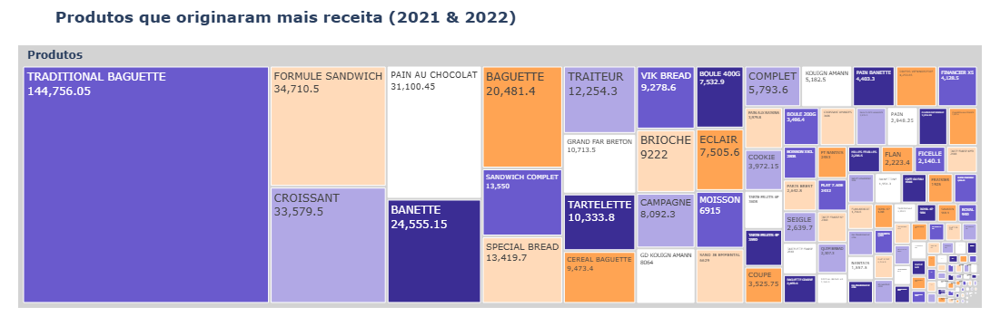

In [51]:
fig = px.treemap(data_frame=df, 
                path=[px.Constant('<b> Produtos'), 
                      'article'], 
                title = '<b> Produtos que originaram mais receita (2021 & 2022)',
                values='total_price')

fig.data[0].textinfo = 'label+text+value'

fig.update_traces(root_color='lightgrey')
 
fig.update_layout(treemapcolorway = ['slateblue', 'peachpuff'], 
                  margin = dict(t=50, l=20, r=20, b=20))

fig.layout.hovermode = False
fig.show()

**Diferenciação de Produtos:**

 - Produtos que geram muita receita mas não estão entre os mais vendidos devem ser posicionados como premium ou promovidos como itens exclusivos.

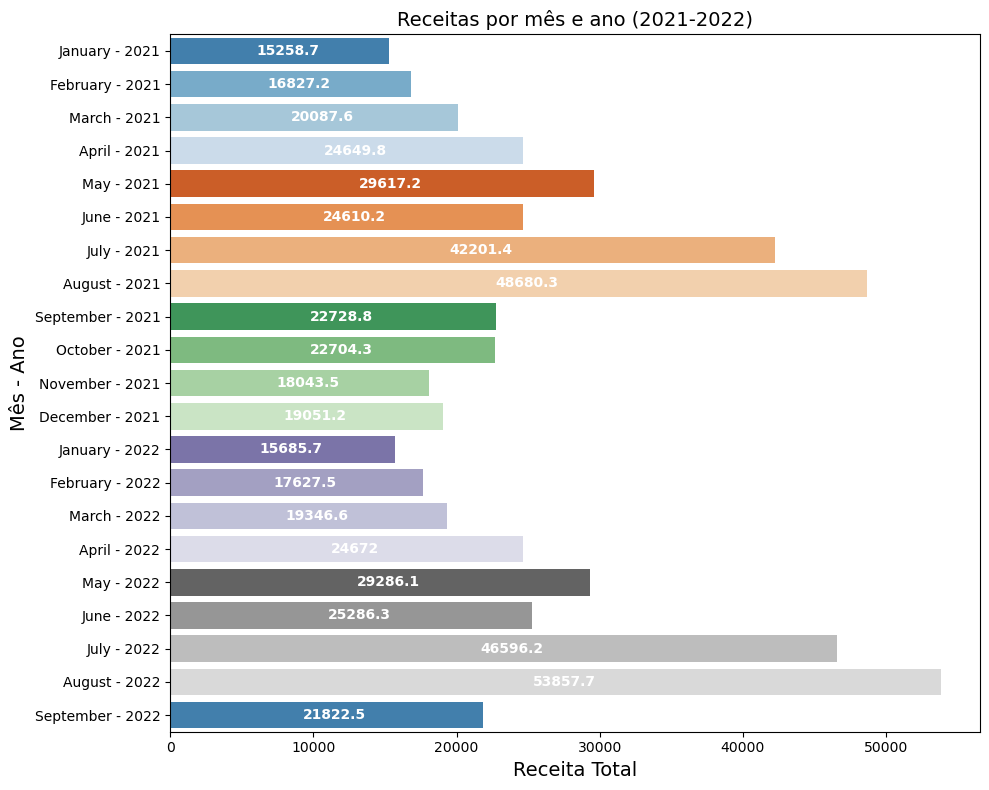

In [53]:
# Criar uma coluna com os números correspondentes aos meses (para ordenação)
month_order = {
    'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6,
    'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12
}
df['month_num'] = df['month'].map(month_order)

# Agrupar os dados por ano e número do mês, somando os valores de receita
df_grouped = (
    df.groupby(['year', 'month', 'month_num'])['total_price']
    .sum()
    .reset_index()
)

# Ordenar os dados por ano e número do mês
df_sorted = df_grouped.sort_values(by=['year', 'month_num'])

# Criar uma nova coluna combinando o nome do mês e o ano para o eixo y
df_sorted['month_year'] = df_sorted['month'] + " - " + df_sorted['year'].astype(str)

# Criar o gráfico de barras horizontais
fig = plt.figure(figsize=(10, 8))
color = sns.color_palette('tab20c')
ax = sns.barplot(data=df_sorted, x='total_price', y='month_year', palette=color, orient='h')

# Adicionar os valores acima de cada barra
for i in ax.containers:
    ax.bar_label(i, padding=6, color='white', fontsize=10, label_type='center', fontweight='bold')

# Ajustar rótulos e título
plt.xlabel('Receita Total', size=14)
plt.ylabel('Mês - Ano', size=14)
plt.title('Receitas por mês e ano (2021-2022)', size=14)

plt.tight_layout()
plt.show()


**O que mostra:**
 - Receita mensal de janeiro de 2021 a setembro de 2022.

**Insights possíveis:**
 - Meses de maior receita podem coincidir com épocas festivas ou promoções (Natal, Verão).
 - Caso haja meses com quedas regulares, pode ser oportuno realizar campanhas promocionais nesses períodos.


**Receita Mensal:**

 - Meses de alta receita: Reforçar stock e planeamento, especialmente em épocas festivas como Natal e Verão.
 - Meses de baixa receita: Criar campanhas promocionais para atrair mais clientes, como descontos ou ofertas especiais.

## Por ano

#### 2021

In [58]:
# Agrupar por 'article' e somar as quantidades
produtos_mais_vendidos_2021 = df_2021.groupby('article')['Quantity'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
produtos_mais_vendidos_2021 = produtos_mais_vendidos_2021.sort_values(ascending=False)

# Mostrar os top 10 produtos mais vendidos
print(produtos_mais_vendidos_2021.head(10))

article
TRADITIONAL BAGUETTE    65619
CROISSANT               16398
PAIN AU CHOCOLAT        13829
COUPE                   13666
BANETTE                 13003
BAGUETTE                12757
CEREAL BAGUETTE          4670
SPECIAL BREAD            3078
FORMULE SANDWICH         2845
TARTELETTE               2837
Name: Quantity, dtype: int64


#### 2022

In [60]:
# Agrupar por 'article' e somar as quantidades
produtos_mais_vendidos_2022 = df_2022.groupby('article')['Quantity'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
produtos_mais_vendidos_2022 = produtos_mais_vendidos_2022.sort_values(ascending=False)

# Mostrar os top 10 produtos mais vendidos
print(produtos_mais_vendidos_2022.head(10))

article
TRADITIONAL BAGUETTE    51844
CROISSANT               13256
PAIN AU CHOCOLAT        11407
COUPE                    9839
BANETTE                  9729
BAGUETTE                 9296
CEREAL BAGUETTE          2757
SPECIAL BREAD            2378
FORMULE SANDWICH         2336
TARTELETTE               2183
Name: Quantity, dtype: int64


### Vendas por hora

In [62]:
# Agrupar os dados pela coluna 'hour' e somar as quantidades vendidas
vendas_por_hora = df.groupby('hour')['Quantity'].sum()

# Ordenar as horas pelas vendas em ordem decrescente
vendas_por_hora = vendas_por_hora.sort_values(ascending=False)

# Mostrar as horas ordenadas
print(vendas_por_hora)

hour
11    69196
10    64496
9     57445
12    52257
8     50412
17    16114
18    13607
7     13432
16    12394
13     8752
19     1478
14      258
15      140
20        7
Name: Quantity, dtype: int64


#### Top 5 Produtos mais vendidos por hora

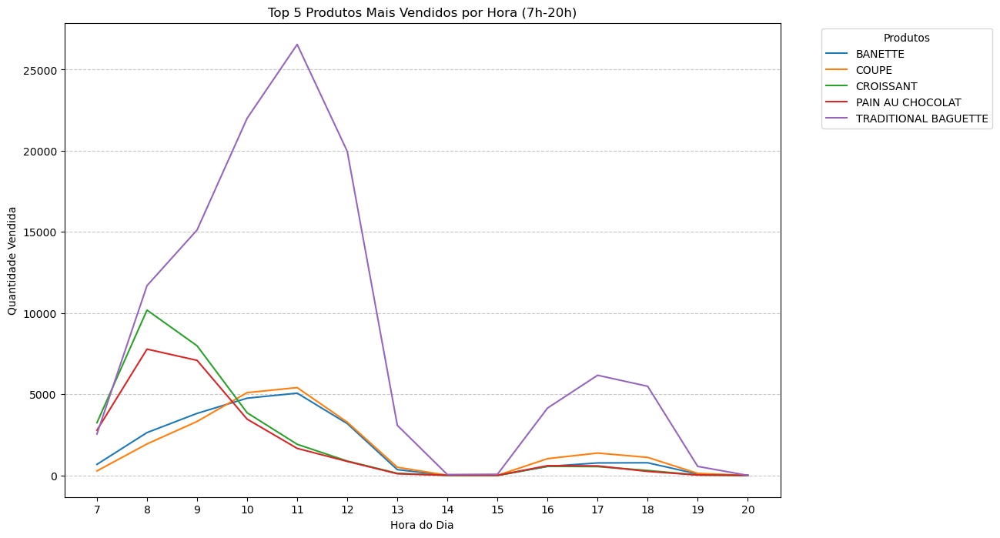

In [64]:
# Identificar os 5 produtos mais vendidos no total
top_5_products = df.groupby('article')['Quantity'].sum().nlargest(5).index

# Filtrar os dados para incluir apenas os top 5 produtos
top_5_data = df[df['article'].isin(top_5_products)]

# Agrupar por hora e produto, somando as quantidades
hourly_top_5 = top_5_data.groupby(['hour', 'article'])['Quantity'].sum().unstack(fill_value=0)

# Filtrar as horas entre 7 e 20
hourly_top_5 = hourly_top_5[(hourly_top_5.index >= 7) & (hourly_top_5.index <= 20)]

# Criar o gráfico temporal
plt.figure(figsize=(12, 8))
for product in hourly_top_5.columns:
    plt.plot(hourly_top_5.index, hourly_top_5[product], label=product)
plt.title('Top 5 Produtos Mais Vendidos por Hora (7h-20h)')
plt.xlabel('Hora do Dia')
plt.ylabel('Quantidade Vendida')
plt.xticks(range(7, 21))  
plt.legend(title='Produtos', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


#### Top 5 produtos com mais receita por hora

**O que mostra:**
 - Um gráfico temporal que mostra as vendas dos produtos mais populares ao longo do dia (7h-20h).
   
**Insights possíveis:**
 - Identificar horários de pico para otimizar operações (por exemplo, reforço de equipas ou stock nesses períodos).
 - Produtos populares podem variar conforme a hora; por exemplo, pães pela manhã e sobremesas à tarde.

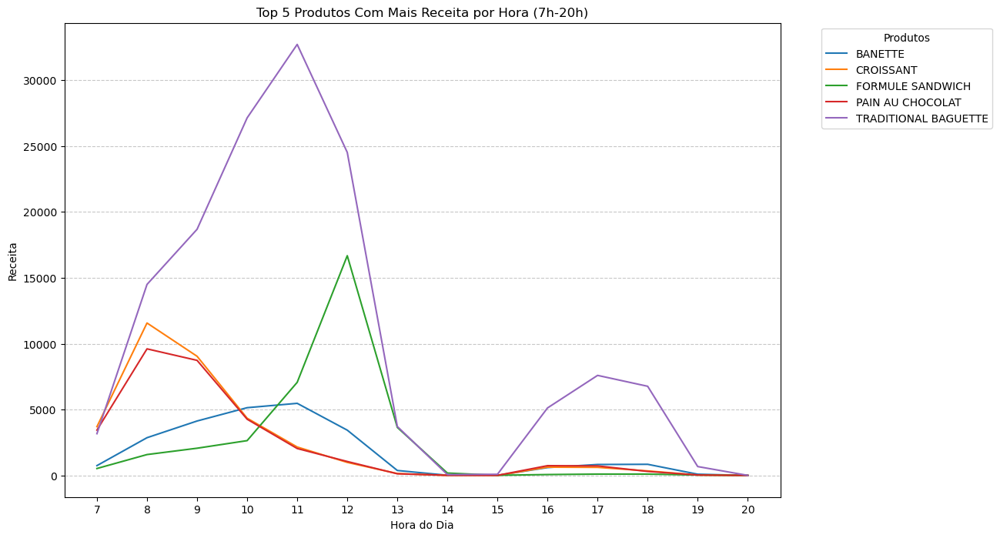

In [67]:
# Identificar os 5 produtos mais vendidos no total
top_5_products = df.groupby('article')['total_price'].sum().nlargest(5).index

# Filtrar os dados para incluir apenas os top 5 produtos
top_5_data = df[df['article'].isin(top_5_products)]

# Agrupar por hora e produto, somando as quantidades
hourly_top_5 = top_5_data.groupby(['hour', 'article'])['total_price'].sum().unstack(fill_value=0)

# Filtrar as horas entre 7 e 20
hourly_top_5 = hourly_top_5[(hourly_top_5.index >= 7) & (hourly_top_5.index <= 20)]

# Criar o gráfico temporal
plt.figure(figsize=(12, 8))
for product in hourly_top_5.columns:
    plt.plot(hourly_top_5.index, hourly_top_5[product], label=product)
plt.title('Top 5 Produtos Com Mais Receita por Hora (7h-20h)')
plt.xlabel('Hora do Dia')
plt.ylabel('Receita')
plt.xticks(range(7, 21))  
plt.legend(title='Produtos', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


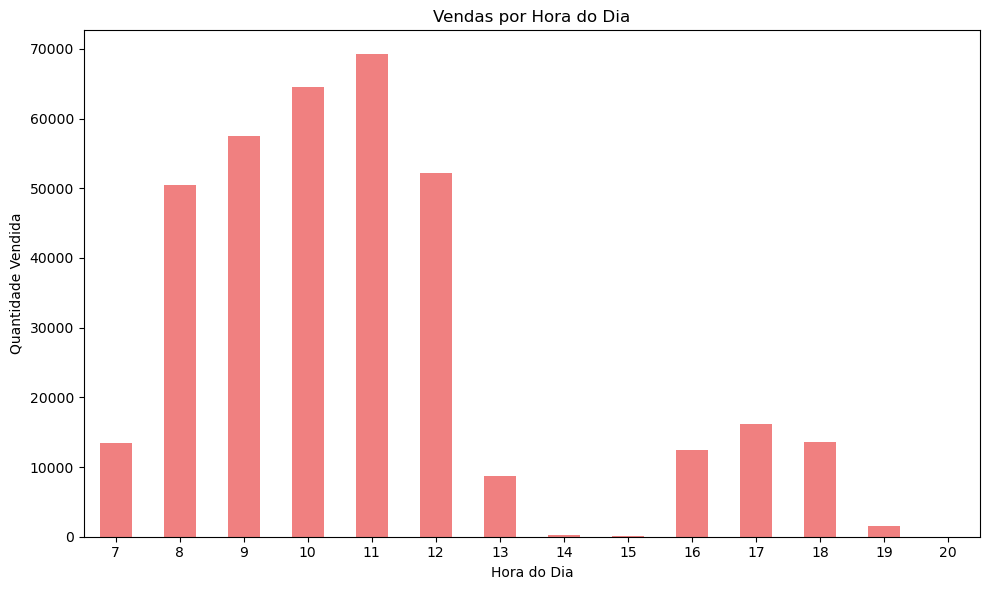

In [68]:
# Ordenar os dados pelo índice (hora do dia)
vendas_por_hora = vendas_por_hora.sort_index()

# Criar o gráfico para visualizar as vendas por hora
plt.figure(figsize=(10, 6))
vendas_por_hora.plot(kind='bar', color='lightcoral')
plt.title('Vendas por Hora do Dia')
plt.xlabel('Hora do Dia')
plt.ylabel('Quantidade Vendida')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

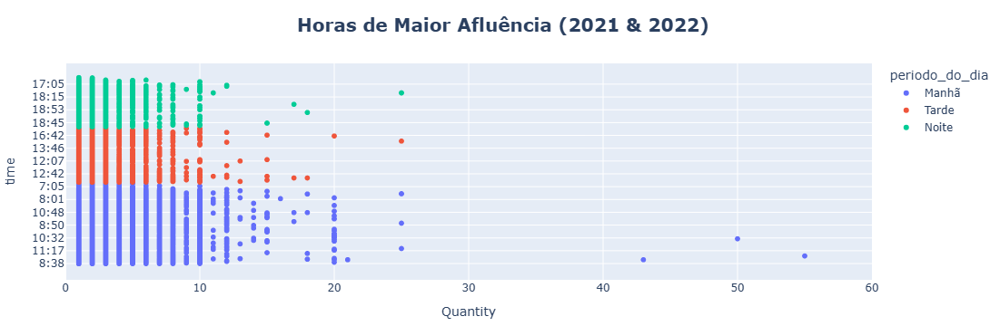

In [69]:
# Day of time distribution
fig = px.scatter(df, x='Quantity', y='time', color='periodo_do_dia')
fig.update_layout(
                xaxis=dict(range=[0, 60]),  # Define o intervalo do eixo X  
                  margin=dict(t=70, b=10, l=20, r=20),
                  title='<b> Horas de Maior Afluência (2021 & 2022)', title_x = 0.5, 
                  titlefont=dict(size=20))
fig.show()

**Horários de Venda:**
 - Concentrar equipas nos horários de pico, garantindo um serviço rápido e eficiente.
 - Analisar a diferença de vendas entre manhã, tarde e noite para otimizar horários de operação ou promoções específicas (por exemplo, descontos de sobremesas à tarde).

## Por ano

#### 2021

In [73]:
# Agrupar os dados pela coluna 'hour' e somar as quantidades vendidas
vendas_por_hora_2021 = df_2021.groupby('hour')['Quantity'].sum()

# Ordenar as horas pelas vendas por ordem 
vendas_por_hora_2021 = vendas_por_hora_2021.sort_index()

# Mostrar as horas ordenadas
print(vendas_por_hora_2021)

hour
7      6393
8     25714
9     31641
10    35689
11    39186
12    31911
13     8236
14      258
15       84
16     6240
17     8945
18     7803
19     1212
20        7
Name: Quantity, dtype: int64


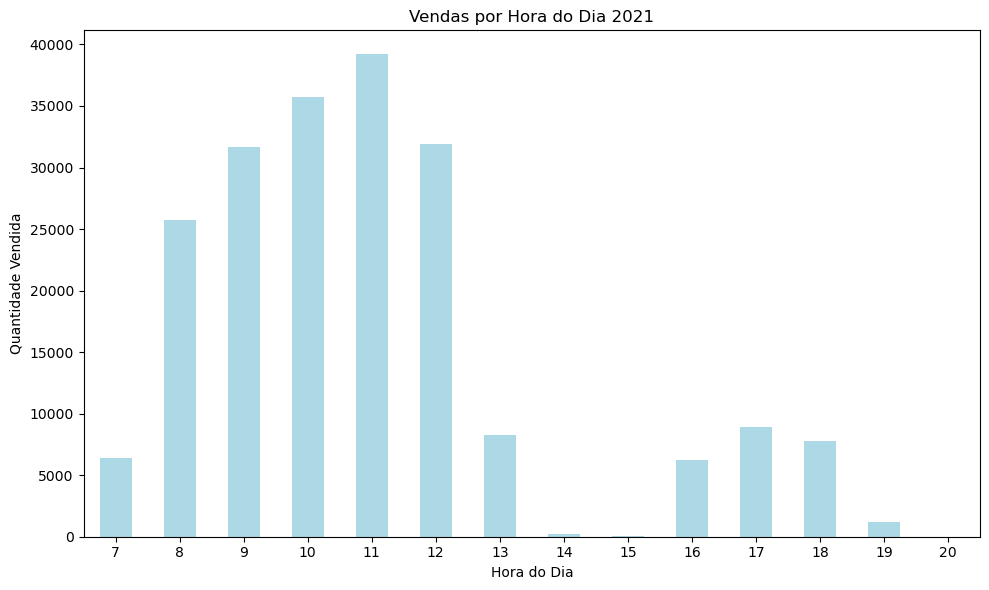

In [74]:
# Criar o gráfico para visualizar as vendas por hora
plt.figure(figsize=(10, 6))
vendas_por_hora_2021.plot(kind='bar', color='lightblue')
plt.title('Vendas por Hora do Dia 2021')
plt.xlabel('Hora do Dia')
plt.ylabel('Quantidade Vendida')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#### 2022

In [76]:
# Agrupar os dados pela coluna 'hour' e somar as quantidades vendidas
vendas_por_hora_2022 = df_2022.groupby('hour')['Quantity'].sum()

# Ordenar as horas pelas vendas por ordem
vendas_por_hora_2022 = vendas_por_hora_2022.sort_index()

# Mostrar as horas ordenadas
print(vendas_por_hora_2022)

hour
7      7039
8     24698
9     25804
10    28807
11    30010
12    20346
13      516
15       56
16     6154
17     7169
18     5804
19      266
Name: Quantity, dtype: int64


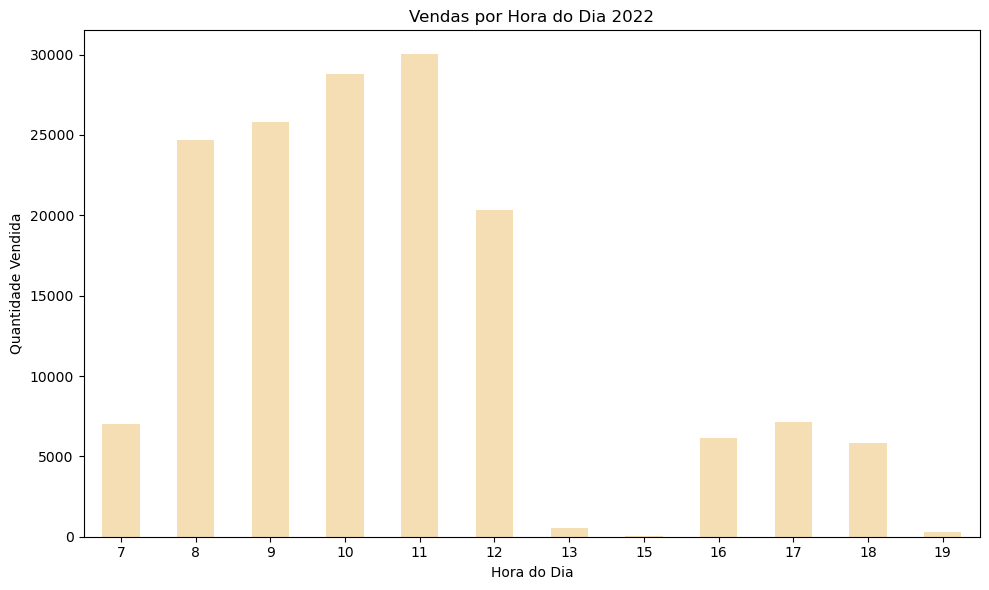

In [77]:
# Criar o gráfico para visualizar as vendas por hora
plt.figure(figsize=(10, 6))
vendas_por_hora_2022.plot(kind='bar', color='wheat')
plt.title('Vendas por Hora do Dia 2022')
plt.xlabel('Hora do Dia')
plt.ylabel('Quantidade Vendida')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Vendas por Hora (2021 vs 2022)
- **2021**:
  - Picos de vendas entre as 8h e as 12h, com o horário das 11h como o mais movimentado.
  - Redução drástica nas vendas após as 13h.
- **2022**:
  - Tendência semelhante, com o pico às 11h e quedas significativas à tarde.
  - O volume total de vendas por hora em 2022 é ligeiramente inferior ao de 2021.

**Insights**:
- O período da manhã (8h-12h) é crucial para maximizar vendas.
- Horários da tarde têm menor movimento, podendo ser alavancados com promoções ou ofertas específicas.

### Vendas por dia da semana

In [79]:
# Definir a ordem dos dias da semana
ordem_dia = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Agrupar os dados pelo dia da semana e somar as quantidades vendidas
vendas_por_dia = df.groupby('day')['Quantity'].sum()

# Converter para categórico ordenado
vendas_por_dia.index = pd.CategoricalIndex(vendas_por_dia.index, categories=ordem_dia, ordered=True)

# Ordenar os dias pelas vendas em ordem decrescente
vendas_por_dia = vendas_por_dia.sort_values(ascending=False)
vendas_por_dia

day
Sunday       83413
Saturday     61702
Friday       48115
Monday       47715
Thursday     44924
Tuesday      42491
Wednesday    31628
Name: Quantity, dtype: int64

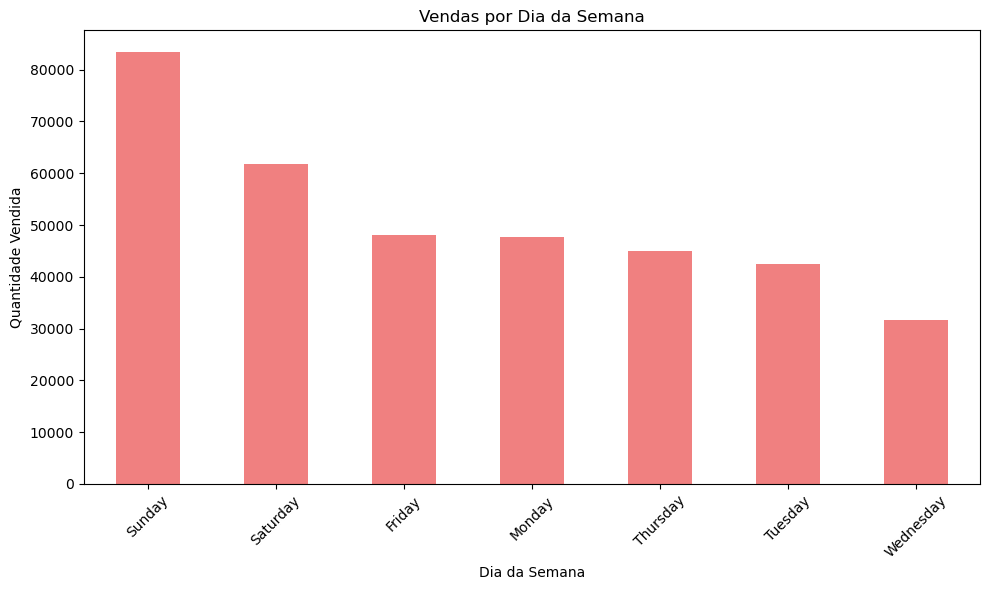

In [80]:
# Criar o gráfico para visualizar as vendas por dia da semana
plt.figure(figsize=(10, 6))
vendas_por_dia.plot(kind='bar', color='lightcoral')
plt.title('Vendas por Dia da Semana')
plt.xlabel('Dia da Semana')
plt.ylabel('Quantidade Vendida')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Por ano

#### 2021

In [83]:
# Agrupar os dados pelo dia da semana e somar as quantidades vendidas
vendas_por_dia_2021 = df_2021.groupby('day')['Quantity'].sum()

# Converter para categórico ordenado
vendas_por_dia_2021.index = pd.CategoricalIndex(vendas_por_dia_2021.index, categories=ordem_dia, ordered=True)

# Ordenar os dias pelas vendas em ordem decrescente
vendas_por_dia_2021 = vendas_por_dia_2021.sort_index()
vendas_por_dia_2021

day
Monday       26080
Tuesday      24328
Wednesday    17073
Thursday     25327
Friday       27795
Saturday     35633
Sunday       47083
Name: Quantity, dtype: int64

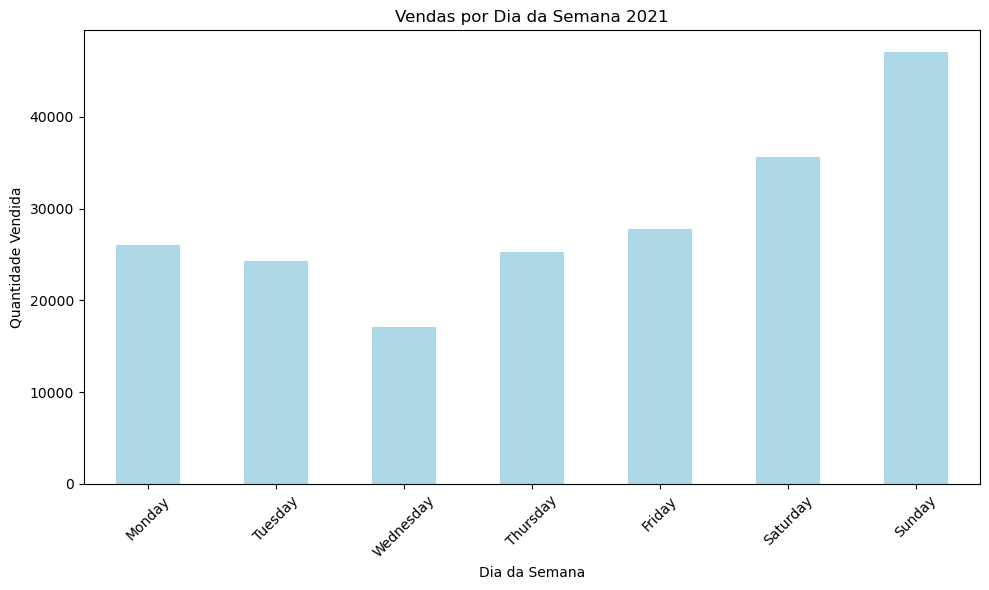

In [84]:
# Criar o gráfico para visualizar as vendas por dia da semana
plt.figure(figsize=(10, 6))
vendas_por_dia_2021.plot(kind='bar', color='lightblue')
plt.title('Vendas por Dia da Semana 2021')
plt.xlabel('Dia da Semana')
plt.ylabel('Quantidade Vendida')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### 2022

In [86]:
# Agrupar os dados pelo dia da semana e somar as quantidades vendidas
vendas_por_dia_2022 = df_2022.groupby('day')['Quantity'].sum()

# Converter para categórico ordenado
vendas_por_dia_2022.index = pd.CategoricalIndex(vendas_por_dia_2022.index, categories=ordem_dia, ordered=True)

# Ordenar os dias pelas vendas em ordem decrescente
vendas_por_dia_2022 = vendas_por_dia_2022.sort_index()

# Mostrar o dia com mais vendas
print(vendas_por_dia_2022)

day
Monday       21635
Tuesday      18163
Wednesday    14555
Thursday     19597
Friday       20320
Saturday     26069
Sunday       36330
Name: Quantity, dtype: int64


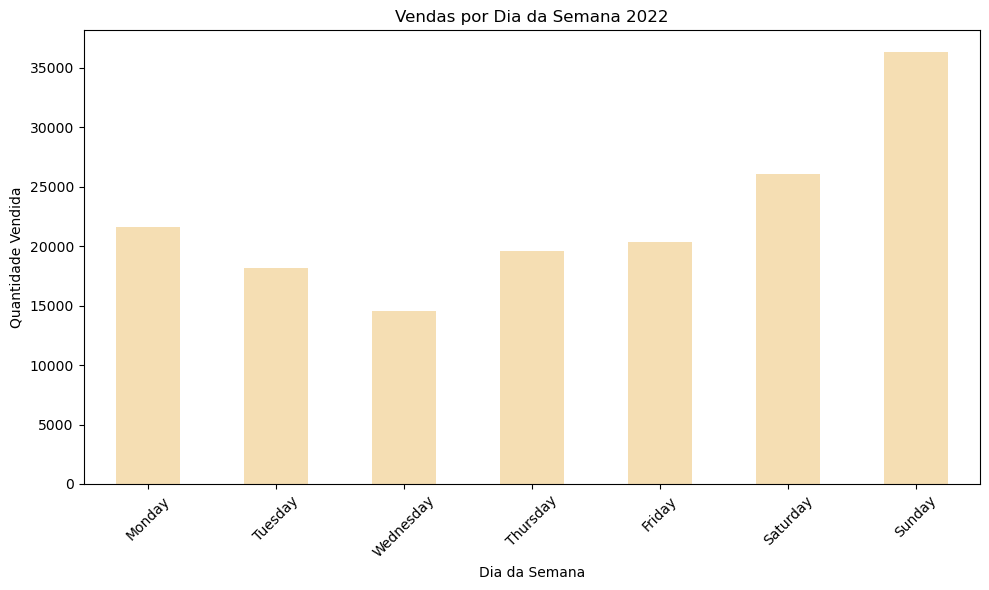

In [87]:
# Criar o gráfico para visualizar as vendas por dia da semana
plt.figure(figsize=(10, 6))
vendas_por_dia_2022.plot(kind='bar', color='wheat')
plt.title('Vendas por Dia da Semana 2022')
plt.xlabel('Dia da Semana')
plt.ylabel('Quantidade Vendida')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Vendas por Dia da Semana (Geral, 2021 e 2022)
- **Geral**:
  - Domingo é o dia com mais vendas, seguido de sábado e sexta-feira.
  - Quartas-feiras apresentam os volumes de vendas mais baixos.
- **2021**:
  - Padrão semelhante, mas as vendas aos domingos e sábados foram ainda mais significativas.
- **2022**:
  - Redução geral nas vendas, mas domingos e sábados mantêm-se como os dias mais fortes.
 
**Insights**:
- Foco estratégico nos fins de semana, garantindo mais stock e recursos.
- Quartas-feiras podem ser alvo de promoções para atrair mais clientes.


## Análise temporal das vendas de 2021

Temos dados a partir de dia 1 de Janeiro de 2021

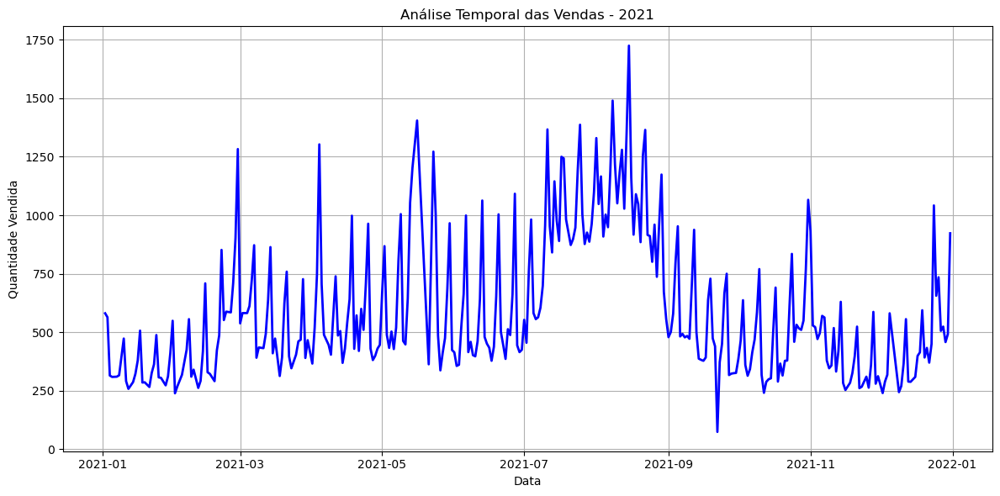

In [90]:
# Filtrar dados para 2021
vendas_2021 = df[df['year'] == 2021].groupby(df['datetime'].dt.date)['Quantity'].sum()

# Gráfico para 2021
plt.figure(figsize=(12, 6))
vendas_2021.plot(kind='line', color='blue', linewidth=2)
plt.title('Análise Temporal das Vendas - 2021')
plt.xlabel('Data')
plt.ylabel('Quantidade Vendida')
plt.grid(True)
plt.tight_layout()
plt.show()

## Análise temporal das vendas de  2022

Apenas temos dados até 30 de Setembro de 2022

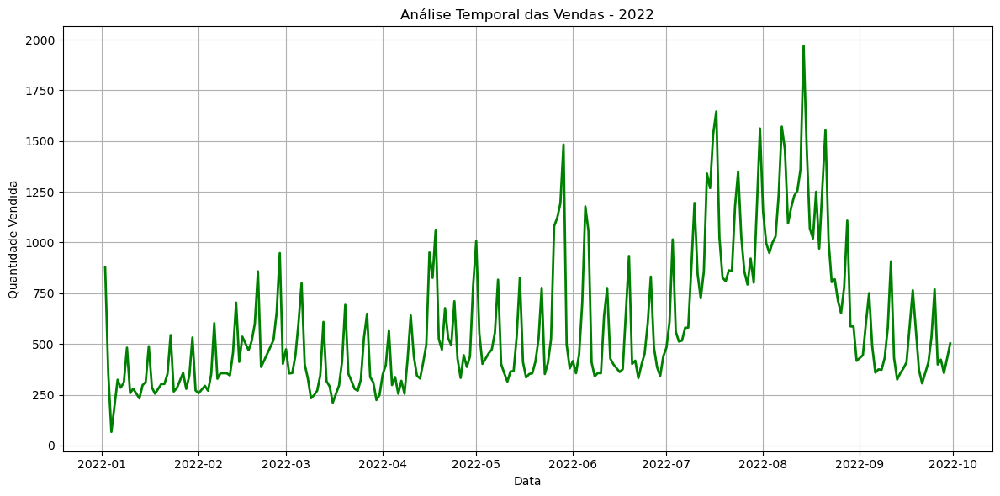

In [93]:
# Filtrar dados para 2022
vendas_2022 = df[df['year'] == 2022].groupby(df['datetime'].dt.date)['Quantity'].sum()

# Gráfico para 2022
plt.figure(figsize=(12, 6))
vendas_2022.plot(kind='line', color='green', linewidth=2)
plt.title('Análise Temporal das Vendas - 2022')
plt.xlabel('Data')
plt.ylabel('Quantidade Vendida')
plt.grid(True)
plt.tight_layout()
plt.show()

### Análise Temporal das Vendas (2021 vs 2022)
- **2021**:
  - Picos regulares ao longo do ano, indicando um padrão consistente de vendas.
- **2022**:
  - Volume de vendas inferior devido a dados limitados (janeiro a setembro).
  - Redução acentuada no volume de vendas em comparação com 2021.

**Insights**:
- Analisar sazonalidade para entender os períodos de maior procura.
- O padrão de 2021 pode ser usado para prever o comportamento em meses ausentes de 2022.

### Aqui vamos fazer uma comparação das quantidades vendidas, das receitas e da percentagem de crescimento de um ano para o outro.

#### Aqui vemos as quantidades vendidas por ano

In [96]:
vendas_ano_qtd = df.groupby('year')['Quantity'].sum()
vendas_ano_qtd

year
2021    203319
2022    156669
Name: Quantity, dtype: int64

#### Aqui vemos a receita total por ano

In [98]:
revenue_ano = df.groupby('year')['total_price'].sum()
revenue_ano

year
2021    304460.32
2022    254180.53
Name: total_price, dtype: float64

#### Anteriormente já tínhamos verificado que não tínhamos os dados completos referentes ao ano 2022...

In [100]:
# Filtrar apenas os dados do ano de 2021
data_2021 = df[df['year'] == 2021]

# Contar os meses distintos no ano de 2021
distinct_month_count = data_2021['month'].nunique()
print(distinct_month_count)

12


In [101]:
# Filtrar apenas os dados do ano de 2022
data_2022 = df[df['year'] == 2022]

# Contar os meses distintos no ano de 2022
distinct_month_count = data_2022['month'].nunique()
print(distinct_month_count)

9


#### Portanto, vamos fazer uma comparação do crescimento das quantidades e das receitas tendo em conta os primeiros de 9 meses de cada ano

In [103]:
# Filtrar os dados para os meses de janeiro a setembro
data_filtered = df[df['date'].dt.month <= 9]

# Calcular métricas apenas para os meses de janeiro a setembro
filtered_comparison = data_filtered[data_filtered['year'].isin([2021, 2022])].groupby('year').agg(
    total_quantity=('Quantity', 'sum'),
    total_revenue=('total_price', 'sum')
).reset_index()

# Calcular a percentagem de evolução das vendas
filtered_comparison['quantity_growth_%'] = filtered_comparison['total_quantity'].pct_change() * 100
filtered_comparison['revenue_growth_%'] = filtered_comparison['total_revenue'].pct_change() * 100

# Exibir os resultados
print(filtered_comparison)

   year  total_quantity  total_revenue  quantity_growth_%  revenue_growth_%
0  2021          164437      244661.27                NaN               NaN
1  2022          156669      254180.53          -4.723998          3.890792


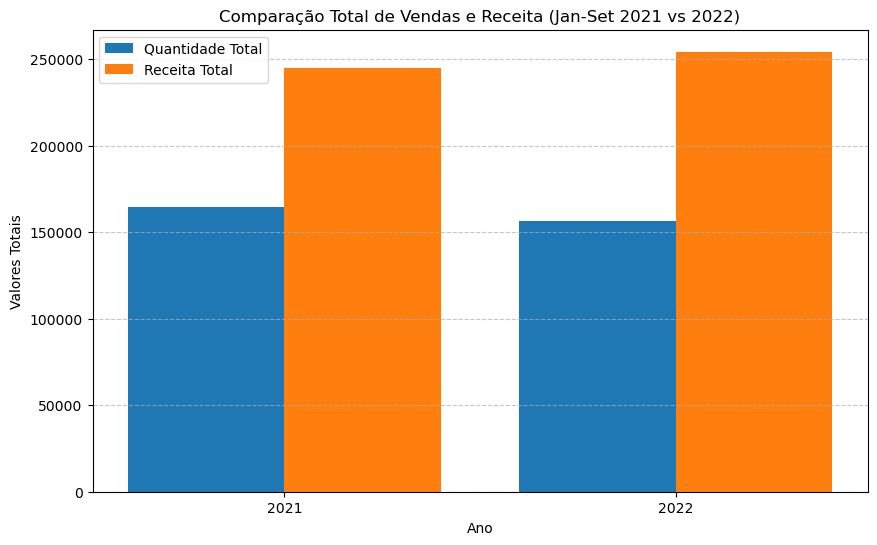

In [104]:
# Criar o gráfico de barras para quantidade total e receita total
plt.figure(figsize=(10, 6))
x = filtered_comparison['year']

# Gráfico de barras para quantidade total
plt.bar(x - 0.2, filtered_comparison['total_quantity'], width=0.4, label='Quantidade Total', align='center')

# Gráfico de barras para receita total
plt.bar(x + 0.2, filtered_comparison['total_revenue'], width=0.4, label='Receita Total', align='center')

plt.title('Comparação Total de Vendas e Receita (Jan-Set 2021 vs 2022)')
plt.xlabel('Ano')
plt.ylabel('Valores Totais')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(x)
plt.show()

### Comparação de Vendas e Receita (2021 vs 2022)
- **Receita total**:
  - 2021: 304.460,32€ 
  - 2022: 254.180,53€
  - Filtrando de janeiro a setembro, houve um ligeiro crescimento na receita (+3,89%) apesar da queda nas quantidades vendidas (-4,72%).

**Insights**:
- Aumento do preço médio por produto contribuiu para a compensação parcial da queda nas vendas.
- Estratégias para diversificar e promover produtos de maior margem podem ser benéficas.

#### Aqui conseguimos visualizar que tivemos menos vendas em 2022, em relação a 2021, no entanto houve mais receita.

#### Vamos a cálculos!

In [107]:
# Contar os dias únicos por ano
dias_por_ano = df.groupby('year')['date'].nunique()
dias_por_ano

year
2021    339
2022    261
Name: date, dtype: int64

#### Aqui vemos qual foi a faturação diária...

In [109]:
# Calcular a média de faturação diária
faturacao_diaria = revenue_ano / dias_por_ano
faturacao_diaria

year
2021    898.113038
2022    973.871762
dtype: float64

#### Aqui o valor médio por transação,

In [111]:
n_transacoes = df.groupby('year')['ticket_number'].nunique()

In [112]:
media_por_transacao = revenue_ano / n_transacoes
media_por_transacao

year
2021    4.002213
2022    4.209820
dtype: float64

#### e o valor médio por produto.

In [114]:
media_por_produto = df.groupby('year')['unit_price'].mean()
media_por_produto

year
2021    1.599526
2022    1.742478
Name: unit_price, dtype: float64

C:\Users\sergio\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.

C:\Users\sergio\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.

C:\Users\sergio\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.

C:\Users\sergio\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



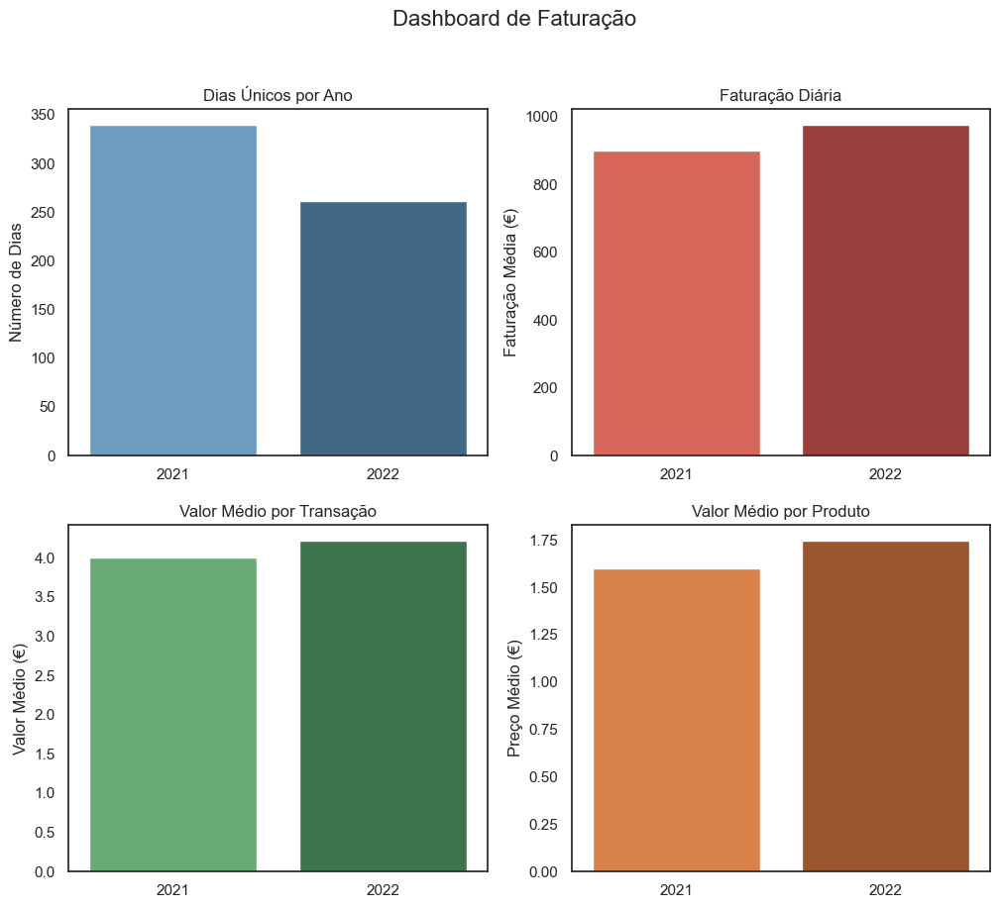

In [115]:
sns.set_theme(style="white")

anos =[2021, 2022]

# Criar o dashboard com 4 gráficos
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Dashboard de Faturação', fontsize=16)

# 1. Dias únicos por ano
sns.barplot(x=anos, y=dias_por_ano, palette="Blues_d", ax=axs[0, 0])
axs[0, 0].set_title('Dias Únicos por Ano')
axs[0, 0].set_ylabel('Número de Dias')

# 2. Faturação diária
sns.barplot(x=anos, y=faturacao_diaria, palette="Reds_d", ax=axs[0, 1])
axs[0, 1].set_title('Faturação Diária')
axs[0, 1].set_ylabel('Faturação Média (€)')

# 3. Valor médio por transação
sns.barplot(x=anos, y=media_por_transacao, palette="Greens_d", ax=axs[1, 0])
axs[1, 0].set_title('Valor Médio por Transação')
axs[1, 0].set_ylabel('Valor Médio (€)')

# 4. Valor médio por produto
sns.barplot(x=anos, y=media_por_produto, palette="Oranges_d", ax=axs[1, 1])
axs[1, 1].set_title('Valor Médio por Produto')
axs[1, 1].set_ylabel('Preço Médio (€)')

plt.show()

### Dashboard de Faturação (2021 vs 2022)
- **Dias únicos com vendas**:
  - 2021: 339 dias
  - 2022: 261 dias (devido a dados limitados).
- **Faturação diária**:
  - 2021: 898,11€ por dia
  - 2022: 973,87€ por dia.
- **Valor médio por transação**:
  - 2021: 4,00€
  - 2022: 4,21€.
- **Preço médio por produto**:
  - 2021: 1,60€
  - 2022: 1,74€.

**Insights**:
- O desempenho por dia e por transação foi superior em 2022, indicando maior eficiência apesar da queda em volume.
- Manter uma estratégia de preços ligeiramente superiores pode ajudar a sustentar margens.

-------------------------------------------------------------------------------------------------------------------

# Conclusões Finais

Com base na análise dos dados e gráficos apresentados, podemos destacar os seguintes pontos principais:

1. **Horários Estratégicos**:
   - O período da manhã (8h-12h) é o horário de maior concentração de vendas, especialmente às 11h. 
   - Os horários da tarde apresentam menor movimento, sugerindo a necessidade de iniciativas específicas para atrair clientes, como promoções ou campanhas direcionadas.

2. **Dias Mais Lucrativos**:
   - Domingos e sábados são consistentemente os dias com maior volume de vendas, representando uma oportunidade para maximizar receitas com promoções e reforço de stock.
   - Quartas-feiras apresentam os menores volumes de vendas, podendo ser alvo de estratégias promocionais para atrair clientes.

3. **Análise Temporal e Sazonalidade**:
   - O padrão de vendas ao longo de 2021 revela picos regulares, indicando consistência na procura. Este padrão pode servir de base para prever o comportamento em períodos ausentes de 2022.
   - A redução de vendas em 2022 deve-se parcialmente à falta de dados completos, mas destaca a importância de ajustar estratégias para manter os níveis de receita.

4. **Receitas e Eficiência**:
   - Apesar da redução no volume de vendas em 2022, o preço médio por produto e por transação aumentou, compensando parcialmente a queda.
   - A faturação diária em 2022 foi superior à de 2021, indicando uma maior eficiência na geração de receita.

5. **Preço Médio por Produto**:
   - O aumento do preço médio por produto (de 1,60€ em 2021 para 1,74€ em 2022) foi um fator-chave para a sustentação das receitas. Estratégias de valor agregado, como produtos premium ou combinações de itens, podem continuar a impulsionar este aumento.

6. **Foco em Decisões Baseadas em Dados**:
   - A análise destaca a importância de entender padrões temporais e comportamentais dos clientes para tomar decisões informadas. 
   - A sazonalidade, o comportamento por hora e por dia, e as tendências de receita devem ser integrados nas estratégias futuras.

**Recomendações**:
- **Promover produtos estratégicos**: Durante os horários da tarde e dias de menor movimento.
- **Otimizar recursos**: Concentrar equipas e stock nos períodos de maior procura (manhãs e fins de semana).
- **Manter a eficiência**: Continuar a implementar estratégias de valor agregado para manter o aumento do preço médio por produto.
- **Monitorizar sazonalidade**: Usar os dados de 2021 para prever padrões e preparar campanhas para períodos específicos.

Este relatório fornece uma base sólida para identificar oportunidades de crescimento, reforçando o foco na eficiência operacional e na satisfação do cliente.
